In [8]:
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from stimage.utils import gene_plot, Read10X, ReadOldST
from stimage.model import negative_binomial_layer, negative_binomial_loss, CNN_NB_model

In [9]:
BASE_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage/dataset/breast_cancer_10x_visium")
TILE_PATH = BASE_PATH / "tiles"
TILE_PATH.mkdir(parents=True, exist_ok=True)

In [10]:
SAMPLE = "block1"
Sample1 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif", 0)
Sample1.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [11]:
SAMPLE = "block2"
Sample2 = st.Read10X(BASE_PATH / SAMPLE, 
                  library_id=SAMPLE, 
                  count_file="V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5",
                  quality="fulres",)
                  #source_image_path=BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_1_image.tif")
img = plt.imread(BASE_PATH / SAMPLE /"V1_Breast_Cancer_Block_A_Section_2_image.tif", 0)
Sample2.uns["spatial"][SAMPLE]['images']["fulres"] = img

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
gene_list=["SLITRK6", "PGM5", "LINC00645", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "MALAT1"]
gene = gene_list[2]

In [57]:
for adata in [
    Sample1,
    Sample2,
]:
#     count_df = adata.to_df()
#     count_df[count_df <=1] = 0
#     count_df[count_df >1] = 1
#     adata.X = count_df
#     adata[:,gene_list]
#     st.pp.filter_genes(adata,min_cells=1)
    st.pp.normalize_total(adata)
#     st.pp.log1p(adata)
#     st.pp.scale(adata)

    # pre-processing for spot image
    TILE_PATH_ = TILE_PATH / list(adata.uns["spatial"].keys())[0]
    TILE_PATH_.mkdir(parents=True, exist_ok=True)
    st.pp.tiling(adata, TILE_PATH_, crop_size=299)
    st.pp.extract_feature(adata)

Normalization step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
Normalization step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [58]:
Sample1.uns["spatial"]["block1"]["images"]["fulres"].shape

(24240, 24240, 3)

In [59]:
from sklearn.linear_model import LinearRegression

lm_row = LinearRegression().fit(Sample1.obs["array_row"].values.reshape(-1, 1), 
                                Sample1.obs["imagerow"].values.reshape(-1, 1))
lm_col = LinearRegression().fit(Sample1.obs["array_col"].values.reshape(-1, 1), 
                                Sample1.obs["imagecol"].values.reshape(-1, 1))
print(lm_row.coef_)
print(lm_col.coef_)

[[237.54863495]]
[[136.52645712]]


In [60]:
training_index = Sample1.obs.sample(frac=0.7, random_state=1).index
training_dataset = Sample1[training_index,].copy()

valid_index = Sample1.obs.index.isin(training_index)
valid_dataset = Sample1[~valid_index,].copy()

test_dataset = Sample2.copy()

In [61]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0,1))

In [62]:
train_X = training_dataset.obsm["X_tile_feature"]
train_Y = scaler.fit_transform(training_dataset[:,gene].to_df())
# train_Y = training_dataset[:,gene].to_df()

In [63]:
valid_X = valid_dataset.obsm["X_tile_feature"]
valid_Y = scaler.fit_transform(valid_dataset[:,gene].to_df())
# valid_Y = valid_dataset[:,gene].to_df()

In [64]:
test_X = test_dataset.obsm["X_tile_feature"]
test_Y = scaler.fit_transform(test_dataset[:,gene].to_df())
# test_Y = test_dataset[:,gene].to_df()

In [65]:
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Lambda, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.losses import BinaryCrossentropy
print(tf.__version__)

2.4.0


In [66]:
model = CNN_NB_model()

In [67]:
EPOCHS = 500

history = model.fit(
  train_X, train_Y, batch_size=100,
  epochs=EPOCHS, validation_data = (valid_X, valid_Y), validation_batch_size = 100)

Epoch 1/500
27/27 [==============================] - 1s 8ms/step - loss: 0.4483 - negative_binomial_loss: 0.4483 - val_loss: 0.2839 - val_negative_binomial_loss: 0.2839
Epoch 2/500
27/27 [==============================] - 0s 4ms/step - loss: 0.3165 - negative_binomial_loss: 0.3165 - val_loss: 0.2322 - val_negative_binomial_loss: 0.2322
Epoch 3/500
27/27 [==============================] - 0s 4ms/step - loss: 0.2521 - negative_binomial_loss: 0.2521 - val_loss: 0.2139 - val_negative_binomial_loss: 0.2139
Epoch 4/500
27/27 [==============================] - 0s 4ms/step - loss: 0.2270 - negative_binomial_loss: 0.2270 - val_loss: 0.2045 - val_negative_binomial_loss: 0.2045
Epoch 5/500
27/27 [==============================] - 0s 3ms/step - loss: 0.2252 - negative_binomial_loss: 0.2252 - val_loss: 0.2004 - val_negative_binomial_loss: 0.2004
Epoch 6/500
27/27 [==============================] - 0s 3ms/step - loss: 0.2024 - negative_binomial_loss: 0.2024 - val_loss: 0.1934 - val_negative_binomial

27/27 [==============================] - 0s 4ms/step - loss: 0.1538 - negative_binomial_loss: 0.1538 - val_loss: 0.1582 - val_negative_binomial_loss: 0.1582
Epoch 98/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1464 - negative_binomial_loss: 0.1464 - val_loss: 0.1570 - val_negative_binomial_loss: 0.1570
Epoch 99/500
27/27 [==============================] - 0s 5ms/step - loss: 0.1487 - negative_binomial_loss: 0.1487 - val_loss: 0.1576 - val_negative_binomial_loss: 0.1576
Epoch 100/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1484 - negative_binomial_loss: 0.1484 - val_loss: 0.1589 - val_negative_binomial_loss: 0.1589
Epoch 101/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1398 - negative_binomial_loss: 0.1398 - val_loss: 0.1576 - val_negative_binomial_loss: 0.1576
Epoch 102/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1410 - negative_binomial_loss: 0.1410 - val_loss: 0.1572 - val_negative_binomial_los

27/27 [==============================] - 0s 3ms/step - loss: 0.1404 - negative_binomial_loss: 0.1404 - val_loss: 0.1560 - val_negative_binomial_loss: 0.1560
Epoch 146/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1450 - negative_binomial_loss: 0.1450 - val_loss: 0.1565 - val_negative_binomial_loss: 0.1565
Epoch 147/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1403 - negative_binomial_loss: 0.1403 - val_loss: 0.1553 - val_negative_binomial_loss: 0.1553
Epoch 148/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1438 - negative_binomial_loss: 0.1438 - val_loss: 0.1572 - val_negative_binomial_loss: 0.1572
Epoch 149/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1482 - negative_binomial_loss: 0.1482 - val_loss: 0.1569 - val_negative_binomial_loss: 0.1569
Epoch 150/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1460 - negative_binomial_loss: 0.1460 - val_loss: 0.1564 - val_negative_binomial_l

Epoch 193/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1347 - negative_binomial_loss: 0.1347 - val_loss: 0.1557 - val_negative_binomial_loss: 0.1557
Epoch 194/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1392 - negative_binomial_loss: 0.1392 - val_loss: 0.1554 - val_negative_binomial_loss: 0.1554
Epoch 195/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1378 - negative_binomial_loss: 0.1378 - val_loss: 0.1550 - val_negative_binomial_loss: 0.1550
Epoch 196/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1413 - negative_binomial_loss: 0.1413 - val_loss: 0.1558 - val_negative_binomial_loss: 0.1558
Epoch 197/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1415 - negative_binomial_loss: 0.1415 - val_loss: 0.1547 - val_negative_binomial_loss: 0.1547
Epoch 198/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1434 - negative_binomial_loss: 0.1434 - val_loss: 0.1563 - val_negat

Epoch 241/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1431 - negative_binomial_loss: 0.1431 - val_loss: 0.1556 - val_negative_binomial_loss: 0.1556
Epoch 242/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1411 - negative_binomial_loss: 0.1411 - val_loss: 0.1560 - val_negative_binomial_loss: 0.1560
Epoch 243/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1450 - negative_binomial_loss: 0.1450 - val_loss: 0.1560 - val_negative_binomial_loss: 0.1560
Epoch 244/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1362 - negative_binomial_loss: 0.1362 - val_loss: 0.1550 - val_negative_binomial_loss: 0.1550
Epoch 245/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1461 - negative_binomial_loss: 0.1461 - val_loss: 0.1561 - val_negative_binomial_loss: 0.1561
Epoch 246/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1440 - negative_binomial_loss: 0.1440 - val_loss: 0.1558 - val_negat

Epoch 289/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1325 - negative_binomial_loss: 0.1325 - val_loss: 0.1532 - val_negative_binomial_loss: 0.1532
Epoch 290/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1444 - negative_binomial_loss: 0.1444 - val_loss: 0.1550 - val_negative_binomial_loss: 0.1550
Epoch 291/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1413 - negative_binomial_loss: 0.1413 - val_loss: 0.1540 - val_negative_binomial_loss: 0.1540
Epoch 292/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1377 - negative_binomial_loss: 0.1377 - val_loss: 0.1554 - val_negative_binomial_loss: 0.1554
Epoch 293/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1505 - negative_binomial_loss: 0.1505 - val_loss: 0.1563 - val_negative_binomial_loss: 0.1563
Epoch 294/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1429 - negative_binomial_loss: 0.1429 - val_loss: 0.1547 - val_negat

Epoch 337/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1456 - negative_binomial_loss: 0.1456 - val_loss: 0.1551 - val_negative_binomial_loss: 0.1551
Epoch 338/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1412 - negative_binomial_loss: 0.1412 - val_loss: 0.1548 - val_negative_binomial_loss: 0.1548
Epoch 339/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1340 - negative_binomial_loss: 0.1340 - val_loss: 0.1546 - val_negative_binomial_loss: 0.1546
Epoch 340/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1399 - negative_binomial_loss: 0.1399 - val_loss: 0.1558 - val_negative_binomial_loss: 0.1558
Epoch 341/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1449 - negative_binomial_loss: 0.1449 - val_loss: 0.1554 - val_negative_binomial_loss: 0.1554
Epoch 342/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1369 - negative_binomial_loss: 0.1369 - val_loss: 0.1542 - val_negat

Epoch 385/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1389 - negative_binomial_loss: 0.1389 - val_loss: 0.1551 - val_negative_binomial_loss: 0.1551
Epoch 386/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1415 - negative_binomial_loss: 0.1415 - val_loss: 0.1552 - val_negative_binomial_loss: 0.1552
Epoch 387/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1333 - negative_binomial_loss: 0.1333 - val_loss: 0.1542 - val_negative_binomial_loss: 0.1542
Epoch 388/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1334 - negative_binomial_loss: 0.1334 - val_loss: 0.1539 - val_negative_binomial_loss: 0.1539
Epoch 389/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1410 - negative_binomial_loss: 0.1410 - val_loss: 0.1541 - val_negative_binomial_loss: 0.1541
Epoch 390/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1359 - negative_binomial_loss: 0.1359 - val_loss: 0.1538 - val_negat

Epoch 433/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1389 - negative_binomial_loss: 0.1389 - val_loss: 0.1547 - val_negative_binomial_loss: 0.1547
Epoch 434/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1437 - negative_binomial_loss: 0.1437 - val_loss: 0.1562 - val_negative_binomial_loss: 0.1562
Epoch 435/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1378 - negative_binomial_loss: 0.1378 - val_loss: 0.1547 - val_negative_binomial_loss: 0.1547
Epoch 436/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1389 - negative_binomial_loss: 0.1389 - val_loss: 0.1551 - val_negative_binomial_loss: 0.1551
Epoch 437/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1360 - negative_binomial_loss: 0.1360 - val_loss: 0.1555 - val_negative_binomial_loss: 0.1555
Epoch 438/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1368 - negative_binomial_loss: 0.1368 - val_loss: 0.1561 - val_negat

Epoch 481/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1337 - negative_binomial_loss: 0.1337 - val_loss: 0.1546 - val_negative_binomial_loss: 0.1546
Epoch 482/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1372 - negative_binomial_loss: 0.1372 - val_loss: 0.1544 - val_negative_binomial_loss: 0.1544
Epoch 483/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1360 - negative_binomial_loss: 0.1360 - val_loss: 0.1543 - val_negative_binomial_loss: 0.1543
Epoch 484/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1436 - negative_binomial_loss: 0.1436 - val_loss: 0.1567 - val_negative_binomial_loss: 0.1567
Epoch 485/500
27/27 [==============================] - 0s 4ms/step - loss: 0.1400 - negative_binomial_loss: 0.1400 - val_loss: 0.1548 - val_negative_binomial_loss: 0.1548
Epoch 486/500
27/27 [==============================] - 0s 3ms/step - loss: 0.1372 - negative_binomial_loss: 0.1372 - val_loss: 0.1537 - val_negat

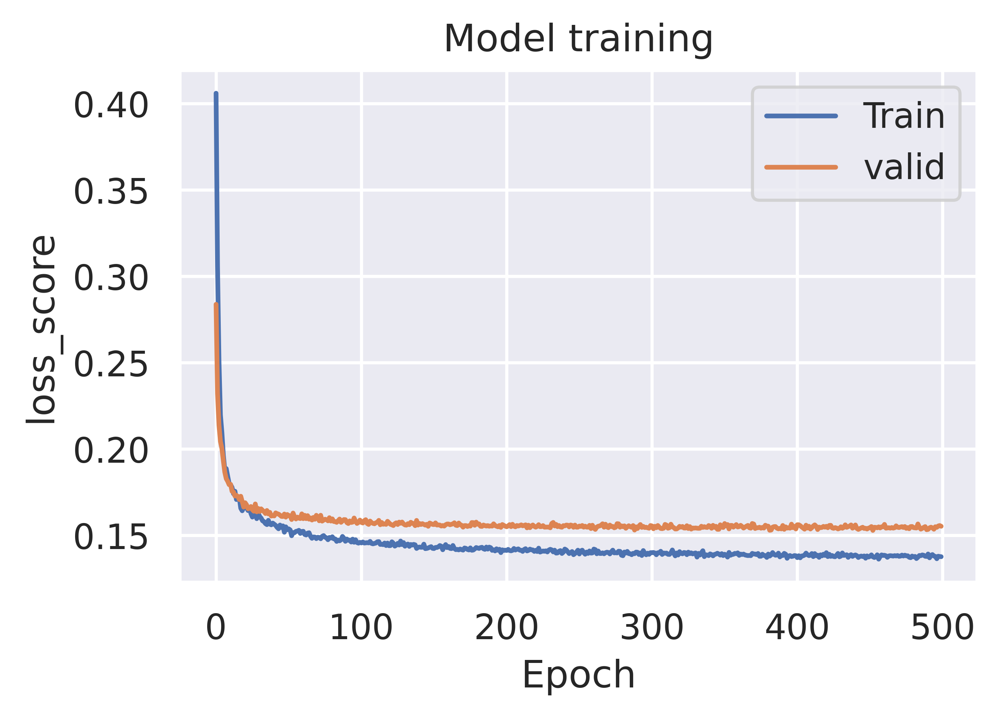

In [68]:
# Plot training & validation acc values
plt.figure(figsize=(10, 3))
plt.subplot(121)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model training')
plt.ylabel('loss_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'valid'], loc='upper right')
plt.show()

In [69]:
test_predictions = model.predict(test_X)
from scipy.stats import nbinom
n = test_predictions[:,0]; p = test_predictions[:,1]
y_pred = nbinom.mean(n,p)
test_dataset.obsm["predicted_gene"] = y_pred

In [70]:
test_dataset_scale = test_dataset[:,gene].copy()
test_dataset_scale.X = test_Y

/scratch/imb/Xiao/STimage/stimage/utils.py:106: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = plt.colorbar(plot, cax=fig.add_axes(


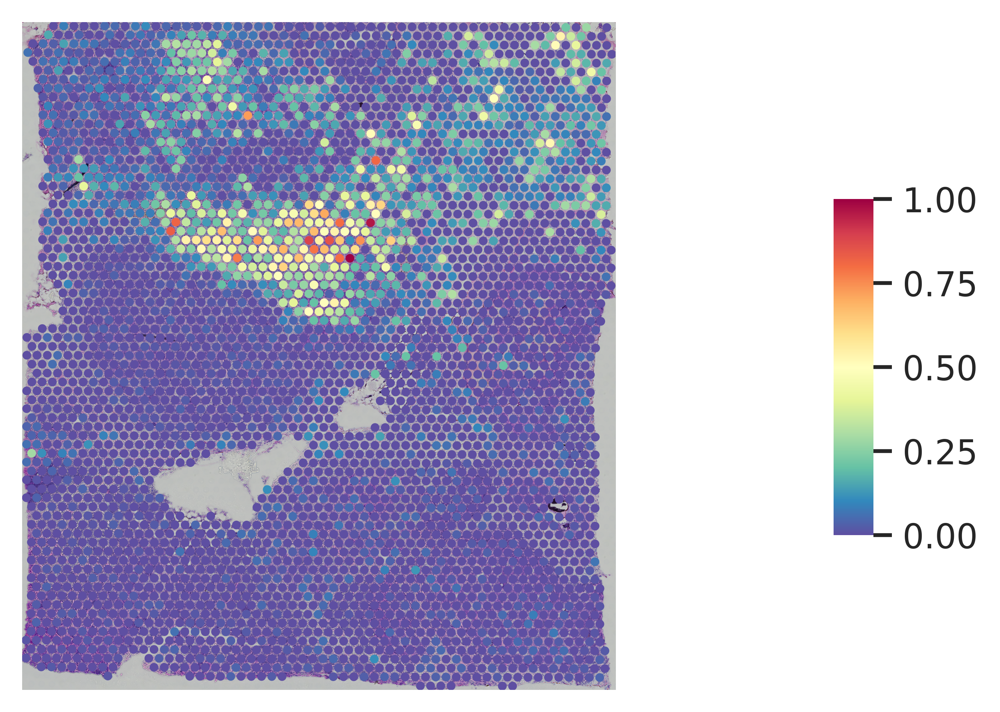

In [71]:
gene_plot(test_dataset_scale, genes=gene, spot_size=8)

In [72]:
test_dataset_ = test_dataset[:,gene].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

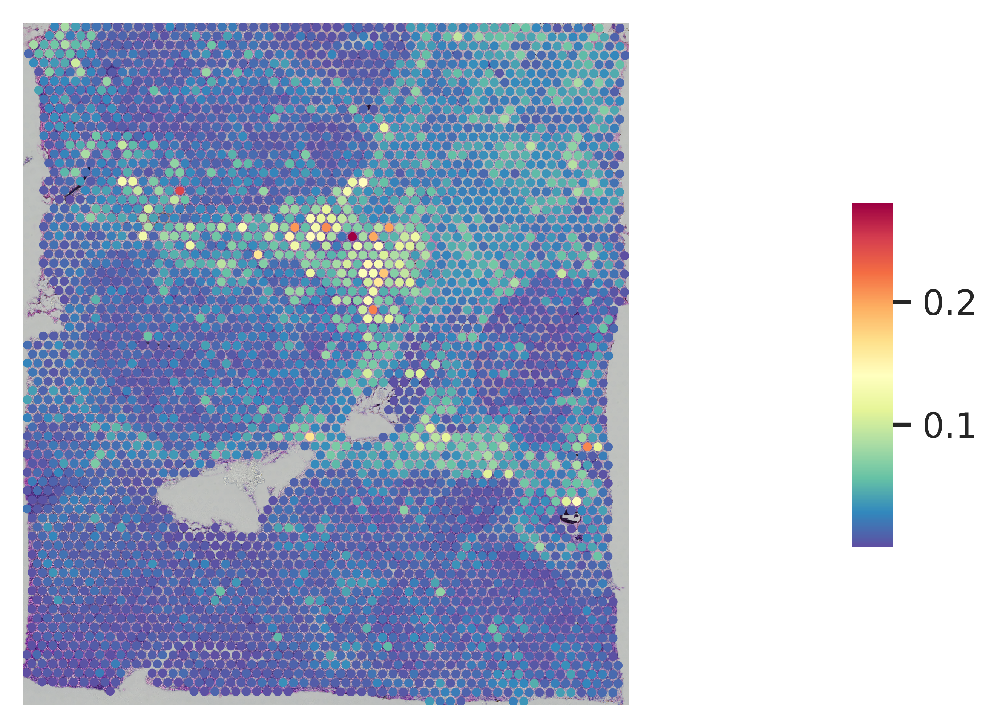

In [73]:
gene_plot(test_dataset_, genes=gene, spot_size=8)

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt


In [75]:
test_Y_ = test_Y.ravel()

In [76]:
df = pd.DataFrame({"true":test_Y_, "pred":y_pred})

Text(0.8, 0.223960280418396, '$R^2:0.13$')

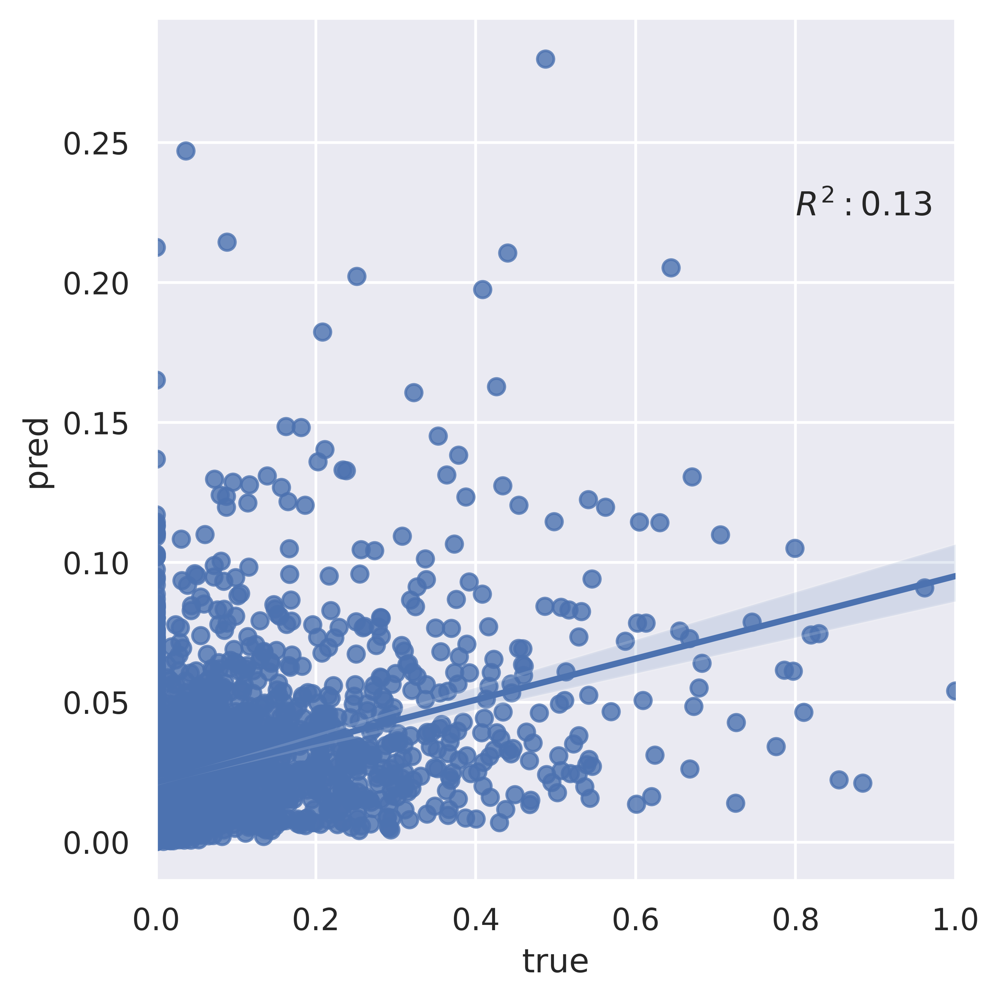

In [77]:
from scipy import stats

r2 = stats.pearsonr(test_Y_, 
                    y_pred)[0] ** 2
sns.set_theme()
g = sns.lmplot(data=df,
    x="true", y="pred",
    height=5, legend=True
)
# g.set(ylim=(0, 360), xlim=(0,360))

g.set_axis_labels("true", "pred")
plt.annotate(r'$R^2:{0:.2f}$'.format(r2),
            (max(test_Y_)*0.8, max(y_pred)*0.8))